# Portfolio Construction with Conditional Mean

In [1]:
import pandas as pd
import numpy as np
import scipy.stats as stats
import statsmodels.api as sm
import statsmodels.tsa.api as tsa
import datetime

import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

from tqdm import tqdm

In [2]:
fama_french_5_daily = pd.read_csv('Developed_5_Factors_Daily.csv')
fama_french_5_daily.columns = ['Date', 'Mkt-RF', 'SMB', 'HML', 'RMW', 'CMA', 'RF']

# parse dates
fama_french_5_daily['Date'] = pd.to_datetime(fama_french_5_daily['Date'], format='%Y%m%d')
fama_french_5_daily.set_index('Date', inplace=True) 

# covert to weekly returns
fama_french_5_weekly= fama_french_5_daily.resample('W').sum()

fama_french_5_weekly.head()

print(fama_french_5_weekly.shape)

(1666, 6)


# Parameters

## Dynamic of expected return

The first step of portfolio construction is to determine the expected return of the portfolio. This can be done in numerous ways. For Markowitz’s method, we can use the mean return of the individual assets, deriving a single number for each asset based on historical data. 

**There are several issues with this method in my opinion:**
1. If we examine the expected return on a daily basis as new data comes in, we will notice that the expected return changes. 
2. Using common sense, we know that the economic conditions change over time. This affects the outlook on the market, hence, the expected return.
3. There is simply no way to know the portfolio we build today will remain resiliant in the future.   
   
**Here is how we can solve this problem:**   
Use the updated expected return of the portfolio. It is a good start, but we can do better

<AxesSubplot:xlabel='Date'>

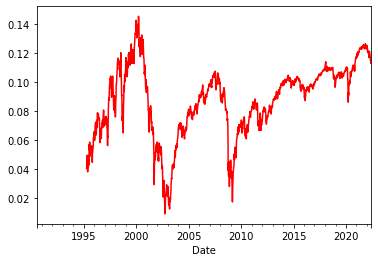

In [3]:
# sample mean on expanding window 
s_mean = fama_french_5_weekly['Mkt-RF'].expanding(250).mean()

# plot bootstrapped mean and sample mean
s_mean.plot(color='red', label='sample mean')


**We would typically stop here and use the expected return of the portfolio to determine the weights of the portfolio.**  
But that is not where we are going to stop at. From market risk management, we know that volatility is not stationary, we can extend the same thinking to mean. (While i have not conducted hypothesis testing on the mean being dynamic, this could be done).  
    
**There is in fact, alternatives to determine expected return. One of which is using exponentially weighted moving average.**  
This approach is obvious as the name suggests. Apply exponential weighting to all data points. By placing more weight on recent observations, we can get a more updated expected return.   
    
**But why should we give weights on all observations? Are all of them relevant?**  
This question led me to think about the dependece. Specifically, the present expected return on past values. And one way to model dependency is to autocorrelation. 

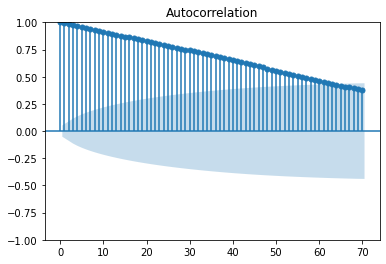

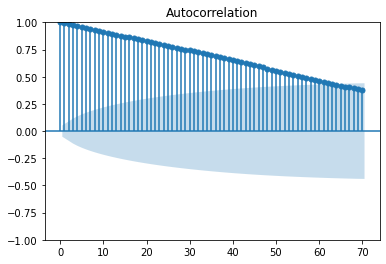

In [4]:
# modelling dependence of the mean on previous values using acf 
sm.graphics.tsa.plot_acf(s_mean.dropna(), lags=70)

Using ACF, we can see that the expected return at present has significant dependence on the past 59 data points at 5% significance level. **This could mean that not all values from the past are relevant.**

In [5]:
acf = sm.tsa.stattools.acf(s_mean.dropna(), nlags=250, alpha = 0.05, bartlett_confint=True)[1][:,0]
cutoff = np.argmax(acf < 0.05)
cutoff

59

If we examine the expected return on an expanding window basis, we can see that the dependence on past values increases over time. **This can be attributed to how market participants strcuture their portfolio and trading decisions.** 

In [6]:
# using acf on a expanding window basis and find the value that drops below the confidence interval 
acf_co = []

for i in tqdm(range(round((len(s_mean.dropna())-250)))):
    acf = sm.tsa.stattools.acf(s_mean.dropna().iloc[:i+250], nlags=250, alpha = 0.05, bartlett_confint=True)[1][:,0]
    cutoff = np.argmax(acf < 0.05)
    acf_co.append(cutoff)

100%|██████████| 1167/1167 [00:01<00:00, 1015.21it/s]


<AxesSubplot:>

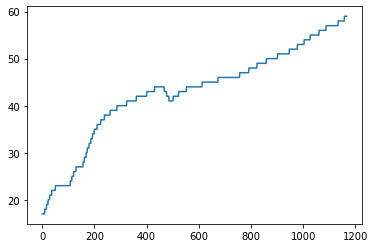

In [7]:
sns.lineplot(x=range(round((len(s_mean.dropna())-250))), y=acf_co)

### Exponentially-Weighted Mean 
As mentioned earlier, the exponentially weighted mean is one of the models out there. But from the earlier analysis, we found that not all data points are relevant. So this prompt us to model the expected return base on values that are considered relevant. (We are essentially modelling a conditional mean that depends on different span of past values).

<AxesSubplot:xlabel='Date'>

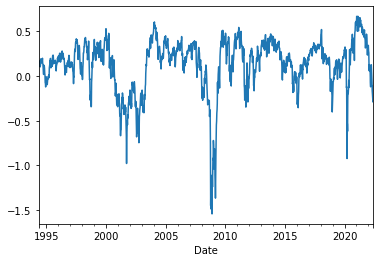

In [8]:
# the choice of center of mass of half life etc depends on the effect of monetary policy, rebalancing frequencies, data avilability, expected return term structure and need for accuracy.
# the choice of span = cutoff is based on the lags ealier, alternative can be the investment period is 5 years as equity yield curve reach its peak.
exp_mean = fama_french_5_weekly['Mkt-RF'].ewm(span=cutoff).mean()
exp_mean[200:].plot(label='exponential mean')

<AxesSubplot:xlabel='Mkt-RF', ylabel='Count'>

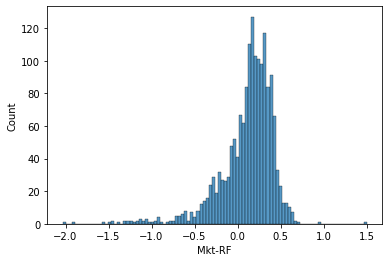

In [9]:
sns.histplot(exp_mean, bins=100, label='exponential mean')

/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


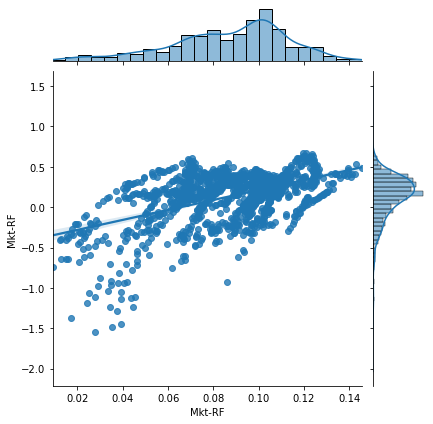

In [10]:
# joint plot of sample mean and exponential mean
sns.jointplot(s_mean, exp_mean, kind='reg')

In [11]:
len(exp_mean)

1666

### Dynamically estimated exponentially weighted mean
The ealier example uses a static cut off, but we can make it dynamic. Take note that we are using two stage estimation, this means we need more data for a more stable estimate. (think law of large number graph)

In [12]:
# this section is essentially to estimate the mean using different span for ewm 

dyn_exp_mean = []

for i in tqdm(range(len(fama_french_5_weekly['Mkt-RF'])-500)):
    
    # first we estimate the span using acf (using acf_co estimated above)
    span = acf_co[i]

    # second we estimate the mean using ewm 
    exp_mean_est = fama_french_5_weekly['Mkt-RF'].iloc[:i+500].ewm(span=span).mean().iloc[-1]

    # lastly, append to exp_mean 
    dyn_exp_mean.append(exp_mean_est)
    


100%|██████████| 1166/1166 [00:00<00:00, 3937.34it/s]


<AxesSubplot:>

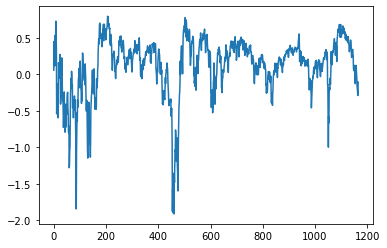

In [13]:
sns.lineplot(x=range(len(fama_french_5_weekly['Mkt-RF'])-500), y=dyn_exp_mean)

/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


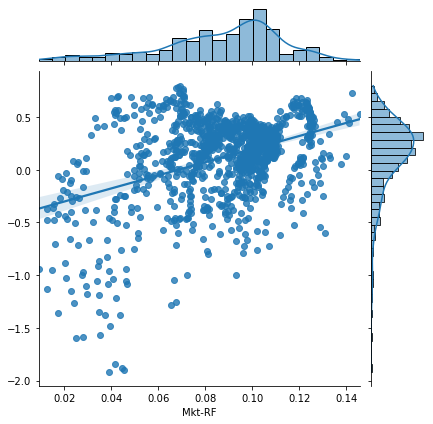

In [14]:
# joint plot of sample mean and exponential mean
sns.jointplot(s_mean[500:], dyn_exp_mean, kind='reg')

**We can compare the two methods by finding their difference.** Apparently, the statically estimated value appears to be higher than the dynamically estimated value. (Hypothesis testing needed to verify this).

<AxesSubplot:xlabel='Date'>

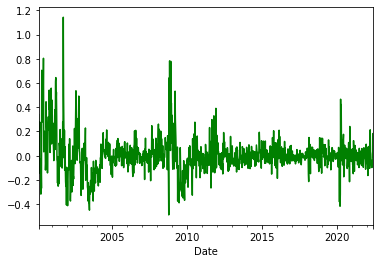

In [15]:
# difference between the staic and dynamic exponentially weighted mean
mean_diff = exp_mean[500:] - dyn_exp_mean
mean_diff.plot(color='green', label='mean difference')

## Variance
A similar story for variance, but there are more risk models that can be used.

<AxesSubplot:xlabel='Date'>

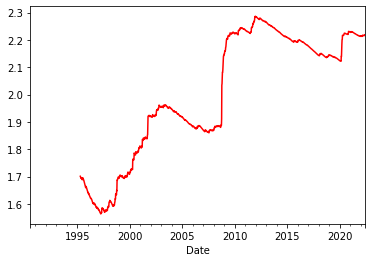

In [16]:
# sample mean on expanding window 
s_var = fama_french_5_weekly['Mkt-RF'].expanding(250).std()
# plot bootstrapped var and sample var
s_var.plot(color='red', label='sample var')


<AxesSubplot:xlabel='Date'>

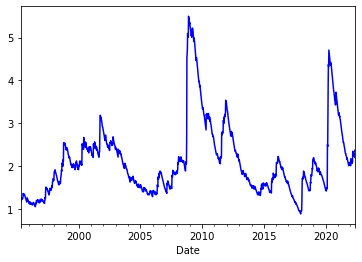

In [17]:
exp_std = fama_french_5_weekly['Mkt-RF'].ewm(span=cutoff).std()
exp_std[250:].plot(color='blue', label='exponential mean')

# Portfolio Construction
We will optimise the portfolio with the 49 industry dataset from fama-french database. The current data is just for asset pricing. 
   
Note: The data used here has been processed to drop all rows with null values and a repeating df.

In [18]:
data = pd.read_csv('49_Industry_Portfolios_Daily.csv',low_memory = False)

# parse dates
data['Date'] = pd.to_datetime(data['Date'], format='%Y%m%d')

data.set_index('Date', inplace=True) 
data= data.resample('W').sum()

# convert returns to decimals
data /= 100
data.head()


,Agric,Food,Soda,Beer,Smoke,Toys,Fun,Books,Hshld,Clths,...,Boxes,Trans,Whlsl,Rtail,Meals,Banks,Insur,RlEst,Fin,Other
Date,,,,,,,,,,,,,,,,,,,,,
1969-07-06,0.0126,0.0251,0.0089,0.0294,0.0177,0.0486,2.360000e-02,0.0085,0.0227,0.0151,...,0.0301,0.0225,0.0262,0.0065,0.0422,0.0414,0.0081,0.0446,0.0142,0.0623
1969-07-13,-0.0224,-0.0300,-0.0163,-0.0225,-0.0313,-0.0735,-1.003000e-01,-0.0279,-0.0448,-0.0415,...,-0.0326,-0.0798,-0.0594,-0.0471,-0.0742,-0.0361,-0.0435,-0.0884,-0.0460,-0.0835
1969-07-20,-0.0248,-0.0170,0.0109,-0.0083,-0.0023,-0.0129,2.220446e-18,-0.0261,0.0076,-0.0200,...,0.0028,-0.0336,-0.0045,-0.0116,-0.0069,-0.0182,-0.0057,-0.0053,-0.0042,-0.0256
1969-07-27,-0.0450,-0.0388,-0.0240,-0.0205,0.0047,-0.0481,-1.940000e-02,-0.0369,-0.0334,-0.0450,...,-0.0154,-0.0527,-0.0449,-0.0231,-0.0480,-0.0400,-0.0210,-0.0718,-0.0505,-0.0577
1969-08-03,0.0439,0.0049,0.0111,0.0240,-0.0207,0.0273,3.470000e-02,-0.0092,0.0272,-0.0084,...,0.0006,0.0436,0.0210,0.0096,0.0317,0.0112,-0.0203,0.0218,0.0221,-0.0200


In [19]:
# using a static value to estimate the mean
exp_mean = data.ewm(span=60).mean()

import plotly.graph_objects as go
import plotly.express as px

px.line(exp_mean[200:])

In [20]:
# import pypfopt to optimise the portfolio
from pypfopt.expected_returns import mean_historical_return
from pypfopt.risk_models import risk_matrix
from pypfopt.risk_models import CovarianceShrinkage
from pypfopt import efficient_frontier
from pypfopt.efficient_frontier import EfficientFrontier
from pypfopt import objective_functions

In [21]:
# cov matrix 
cov_matrix = risk_matrix(data, returns_data=True, frequency=52, log_returns=False, method='sample_cov')
cov_matrix.head()

,Agric,Food,Soda,Beer,Smoke,Toys,Fun,Books,Hshld,Clths,...,Boxes,Trans,Whlsl,Rtail,Meals,Banks,Insur,RlEst,Fin,Other
Agric,0.052412,0.014785,0.017084,0.016189,0.017262,0.025622,0.029129,0.024731,0.016393,0.024615,...,0.022767,0.025593,0.023939,0.020381,0.022654,0.025579,0.022565,0.029003,0.026499,0.022999
Food,0.014785,0.022216,0.019852,0.019262,0.019624,0.020119,0.020877,0.018995,0.018667,0.019488,...,0.018250,0.019010,0.018233,0.018863,0.020047,0.020000,0.019612,0.018404,0.018768,0.018330
Soda,0.017084,0.019852,0.052711,0.025314,0.021645,0.025298,0.027706,0.024218,0.023274,0.024868,...,0.023779,0.023652,0.022554,0.023741,0.026012,0.026749,0.024852,0.025402,0.025680,0.022089
Beer,0.016189,0.019262,0.025314,0.035440,0.021054,0.023605,0.023521,0.020617,0.022669,0.021153,...,0.020616,0.021351,0.020267,0.021386,0.023780,0.022306,0.021866,0.020370,0.020829,0.020673
Smoke,0.017262,0.019624,0.021645,0.021054,0.051088,0.023624,0.023186,0.019645,0.021736,0.020236,...,0.020723,0.020603,0.020092,0.019509,0.022465,0.021130,0.021739,0.019865,0.020031,0.020780


In [22]:
# Different cov Matix 
# cov_matrix = risk_matrix(data, returns_data=True, frequency=52, log_returns=False, method='semicovariance')
# cov_matrix = risk_matrix(data, returns_data=True, frequency=52, log_returns=False, method='exp_cov')
# cov_matrix = risk_matrix(data, returns_data=True, frequency=52, log_returns=False, method='oracle_approximating')

### Set individual asset weight bound

In [23]:
weight_bounds = (-0.1,0.1)

### Optimal Risky Portfolio - sample mean and covariance 

In [24]:
# Optimization
mu = data.mean()*52
# covariance shrinkage
S = cov_matrix

# allocation rule 
ef = EfficientFrontier(mu, S, weight_bounds=weight_bounds)

# clean Negligible weights
ef.add_objective(objective_functions.L2_reg, gamma=0.1)
w = ef.max_sharpe(risk_free_rate=0.02)
print(ef.clean_weights())

print('-'*50)
# Portfolio performance
ef.portfolio_performance(verbose=True)


OrderedDict([('Agric', 0.06999), ('Food ', 0.09211), ('Soda ', 0.06128), ('Beer ', 0.08489), ('Smoke', 0.1), ('Toys ', -0.0564), ('Fun  ', 0.04476), ('Books', -0.01087), ('Hshld', 0.01851), ('Clths', 0.02204), ('Hlth ', -0.01595), ('MedEq', 0.04845), ('Drugs', 0.06882), ('Chems', 0.02151), ('Rubbr', 0.04492), ('Txtls', -0.01311), ('BldMt', 0.0086), ('Cnstr', -0.02425), ('Steel', -0.05938), ('FabPr', -0.0236), ('Mach ', 0.00259), ('ElcEq', 0.0316), ('Autos', 0.00874), ('Aero ', 0.02688), ('Ships', 0.02268), ('Guns ', 0.1), ('Gold ', 0.06245), ('Mines', 0.00941), ('Coal ', 0.02525), ('Oil  ', 0.05979), ('Util ', 0.06759), ('Telcm', 0.04977), ('PerSv', -0.08681), ('BusSv', 0.00468), ('Hardw', 0.00153), ('Softw', -0.00146), ('Chips', 0.04611), ('LabEq', 0.02246), ('Paper', 0.00721), ('Boxes', 0.02504), ('Trans', 0.00595), ('Whlsl', 0.01477), ('Rtail', 0.05369), ('Meals', 0.03443), ('Banks', 0.01663), ('Insur', 0.0472), ('RlEst', -0.089), ('Fin  ', 0.04533), ('Other', -0.09684)])
----------

/opt/anaconda3/lib/python3.8/site-packages/pypfopt/efficient_frontier/efficient_frontier.py:257: UserWarning:

max_sharpe transforms the optimization problem so additional objectives may not work as expected.



(0.155337288669543, 0.14371549551444207, 0.9417028288083442)

### Optimal Risky Portfolio - exponential mean and covariance 

In [25]:
# Optimization
mu = exp_mean.iloc[-1,:]*52

# covariance shrinkage
S = cov_matrix

# allocation rule 
ef = EfficientFrontier(mu, S, weight_bounds=weight_bounds)

# clean Negligible weights
ef.add_objective(objective_functions.L2_reg, gamma=0.1)
w = ef.max_sharpe(risk_free_rate=0.02)
print(ef.clean_weights())

print('-'*50)
# Portfolio performance
ef.portfolio_performance(verbose=True)

OrderedDict([('Agric', 0.1), ('Food ', 0.1), ('Soda ', 0.1), ('Beer ', 0.1), ('Smoke', 0.1), ('Toys ', -0.1), ('Fun  ', -0.1), ('Books', -0.05653), ('Hshld', 0.04787), ('Clths', -0.09949), ('Hlth ', -0.1), ('MedEq', -0.05045), ('Drugs', 0.09654), ('Chems', 0.08489), ('Rubbr', -0.01206), ('Txtls', -0.00173), ('BldMt', 0.01535), ('Cnstr', -0.03903), ('Steel', 0.1), ('FabPr', 0.1), ('Mach ', -0.02475), ('ElcEq', -0.1), ('Autos', 0.05035), ('Aero ', -0.03361), ('Ships', 0.07009), ('Guns ', 0.1), ('Gold ', 0.08376), ('Mines', -0.00115), ('Coal ', 0.1), ('Oil  ', 0.1), ('Util ', 0.1), ('Telcm', 0.01608), ('PerSv', 0.04452), ('BusSv', -0.1), ('Hardw', 0.00485), ('Softw', -0.05784), ('Chips', 0.07318), ('LabEq', 0.01079), ('Paper', -0.01402), ('Boxes', 0.02842), ('Trans', -0.04716), ('Whlsl', 0.1), ('Rtail', -0.05844), ('Meals', 0.02813), ('Banks', 0.01246), ('Insur', 0.1), ('RlEst', -0.03326), ('Fin  ', 0.00558), ('Other', 0.05667)])
--------------------------------------------------
Expected

(0.712928395321776, 0.16005380928654672, 4.32934647672906)

### Optimal Risky Portfolio - exponential mean and shurnk covariance 

In [26]:
# Optimization
mu = exp_mean.iloc[-1,:]*52

# covariance shrinkage
S = risk_matrix(data, returns_data=True, frequency=52, log_returns=False, method='oracle_approximating')

# allocation rule 
ef = EfficientFrontier(mu, S, weight_bounds=weight_bounds)

# clean Negligible weights
ef.add_objective(objective_functions.L2_reg, gamma=0.1)
w = ef.max_sharpe(risk_free_rate=0.02)
print(ef.clean_weights())

print('-'*50)
# Portfolio performance
ef.portfolio_performance(verbose=True)

OrderedDict([('Agric', 0.1), ('Food ', 0.1), ('Soda ', 0.1), ('Beer ', 0.1), ('Smoke', 0.1), ('Toys ', -0.1), ('Fun  ', -0.1), ('Books', -0.05647), ('Hshld', 0.04778), ('Clths', -0.0994), ('Hlth ', -0.1), ('MedEq', -0.05038), ('Drugs', 0.0964), ('Chems', 0.08481), ('Rubbr', -0.01206), ('Txtls', -0.00174), ('BldMt', 0.01535), ('Cnstr', -0.03893), ('Steel', 0.1), ('FabPr', 0.1), ('Mach ', -0.02467), ('ElcEq', -0.1), ('Autos', 0.05031), ('Aero ', -0.03352), ('Ships', 0.07005), ('Guns ', 0.1), ('Gold ', 0.08372), ('Mines', -0.00106), ('Coal ', 0.1), ('Oil  ', 0.1), ('Util ', 0.1), ('Telcm', 0.01602), ('PerSv', 0.04447), ('BusSv', -0.1), ('Hardw', 0.00485), ('Softw', -0.05781), ('Chips', 0.07308), ('LabEq', 0.01079), ('Paper', -0.01399), ('Boxes', 0.02839), ('Trans', -0.04709), ('Whlsl', 0.1), ('Rtail', -0.0584), ('Meals', 0.02808), ('Banks', 0.01246), ('Insur', 0.1), ('RlEst', -0.03323), ('Fin  ', 0.00558), ('Other', 0.05661)])
--------------------------------------------------
Expected an

/opt/anaconda3/lib/python3.8/site-packages/pypfopt/efficient_frontier/efficient_frontier.py:257: UserWarning:

max_sharpe transforms the optimization problem so additional objectives may not work as expected.



(0.7128378888280081, 0.1599771015582193, 4.330856616850686)

### Optimal Risky Portfolio - exponential mean and exponential covariance 

In [27]:
# Optimization
mu = exp_mean.iloc[-1,:]*52

# covariance shrinkage
S = risk_matrix(data, returns_data=True, frequency=52, log_returns=False, method='exp_cov')

# allocation rule 
ef = EfficientFrontier(mu, S, weight_bounds=weight_bounds)

# clean Negligible weights
ef.add_objective(objective_functions.L2_reg, gamma=0.1)
w = ef.max_sharpe(risk_free_rate=0.02)
print(ef.clean_weights())

print('-'*50)
# Portfolio performance
ef.portfolio_performance(verbose=True)


OrderedDict([('Agric', 0.1), ('Food ', 0.1), ('Soda ', 0.1), ('Beer ', 0.1), ('Smoke', 0.1), ('Toys ', -0.1), ('Fun  ', -0.1), ('Books', -0.07373), ('Hshld', 0.07361), ('Clths', -0.1), ('Hlth ', -0.1), ('MedEq', -0.04125), ('Drugs', 0.1), ('Chems', 0.1), ('Rubbr', 0.00011), ('Txtls', -0.07048), ('BldMt', 0.0311), ('Cnstr', -0.01644), ('Steel', 0.072), ('FabPr', 0.09607), ('Mach ', -0.02301), ('ElcEq', -0.1), ('Autos', 0.02577), ('Aero ', -0.1), ('Ships', 0.04936), ('Guns ', 0.1), ('Gold ', 0.07423), ('Mines', -0.03171), ('Coal ', 0.1), ('Oil  ', 0.1), ('Util ', 0.1), ('Telcm', -0.00203), ('PerSv', 0.05036), ('BusSv', -0.1), ('Hardw', -0.02293), ('Softw', -0.0095), ('Chips', 0.1), ('LabEq', 0.1), ('Paper', 0.01247), ('Boxes', 0.01414), ('Trans', -0.05817), ('Whlsl', 0.1), ('Rtail', -0.03557), ('Meals', 0.061), ('Banks', 0.00096), ('Insur', 0.1), ('RlEst', -0.05915), ('Fin  ', 0.02999), ('Other', 0.05282)])
--------------------------------------------------
Expected annual return: 69.0%


(0.689544063722803, 0.19785760728474858, 3.383969274222661)

### Optimal Risky Portfolio - exponential mean and semicovariance 

In [28]:
# Optimization
mu = exp_mean.iloc[-1,:]*52

# covariance shrinkage
S = risk_matrix(data, returns_data=True, frequency=52, log_returns=False, method='semicovariance')

# allocation rule 
ef = EfficientFrontier(mu, S, weight_bounds=weight_bounds)

# clean Negligible weightsa
ef.add_objective(objective_functions.L2_reg, gamma=0.1)
w = ef.max_sharpe(risk_free_rate=0.02)
print(ef.clean_weights())

print('-'*50)
# Portfolio performance
ef.portfolio_performance(verbose=True)


OrderedDict([('Agric', 0.1), ('Food ', 0.1), ('Soda ', 0.1), ('Beer ', 0.1), ('Smoke', 0.1), ('Toys ', -0.1), ('Fun  ', -0.1), ('Books', -0.04565), ('Hshld', 0.03458), ('Clths', -0.08792), ('Hlth ', -0.1), ('MedEq', -0.0438), ('Drugs', 0.0748), ('Chems', 0.08369), ('Rubbr', -0.01072), ('Txtls', -0.0107), ('BldMt', 0.02181), ('Cnstr', -0.02268), ('Steel', 0.1), ('FabPr', 0.1), ('Mach ', -0.00435), ('ElcEq', -0.08515), ('Autos', 0.03993), ('Aero ', -0.01663), ('Ships', 0.06336), ('Guns ', 0.1), ('Gold ', 0.05183), ('Mines', 0.02714), ('Coal ', 0.1), ('Oil  ', 0.1), ('Util ', 0.1), ('Telcm', 0.00774), ('PerSv', 0.03433), ('BusSv', -0.08826), ('Hardw', -0.00328), ('Softw', -0.07252), ('Chips', 0.04645), ('LabEq', 0.00796), ('Paper', -0.00181), ('Boxes', 0.02921), ('Trans', -0.03265), ('Whlsl', 0.1), ('Rtail', -0.05241), ('Meals', 0.01987), ('Banks', 0.01443), ('Insur', 0.1), ('RlEst', -0.03305), ('Fin  ', 0.0072), ('Other', 0.04721)])
--------------------------------------------------
Expe

(0.6965919377828975, 0.12197349773003197, 5.547040548762659)

# Reallocation - static estimation of exponential mean
Suppose we reevaluate the fund every week, we run the estimation and allocation over and over again.

In [29]:
# initialise a list to store weights, it will be a 2d df with date index and asset name as columns 
weekly_weights = []

# loop through the dataset, ignorning the first 250 data as they are unstable but will be used to estimate parameter
for i in tqdm(range(round((len(data)-250)))):

    mu = exp_mean.iloc[i,:]*52

    # covariance shrinkage
    S = risk_matrix(data[:250+i], returns_data=True, frequency=52, log_returns=False, method='semicovariance')

    # allocation rule 
    ef = EfficientFrontier(mu, S, weight_bounds=weight_bounds)

    # clean Negligible weights
    ef.add_objective(objective_functions.L2_reg, gamma=0.1)
    w = ef.max_sharpe(risk_free_rate=0.02)

    weekly_weights.append(ef.clean_weights())

100%|██████████| 2512/2512 [00:58<00:00, 42.59it/s]


In [30]:
weekly_weights = pd.DataFrame(weekly_weights, index=data[250:].index)
weekly_weights.head()

,Agric,Food,Soda,Beer,Smoke,Toys,Fun,Books,Hshld,Clths,...,Boxes,Trans,Whlsl,Rtail,Meals,Banks,Insur,RlEst,Fin,Other
Date,,,,,,,,,,,,,,,,,,,,,
1974-04-21,-0.03097,0.08470,-0.02226,0.09137,0.02277,0.09865,-0.05145,-0.07610,0.03338,-0.04594,...,0.08383,-0.0105,0.00691,-0.05885,0.06467,0.10000,-0.05802,0.04151,-0.03224,0.10000
1974-04-28,0.09805,0.10000,0.10000,0.10000,0.09392,-0.05907,-0.10000,0.02021,0.01595,-0.03438,...,0.10000,-0.1000,-0.10000,-0.10000,-0.10000,0.10000,-0.09280,-0.10000,-0.07254,-0.05237
1974-05-05,0.01224,0.10000,0.10000,0.10000,0.10000,-0.04300,-0.10000,-0.06363,0.10000,-0.06723,...,0.10000,-0.1000,-0.01583,-0.08895,-0.04283,0.10000,-0.01629,-0.10000,0.01201,-0.09653
1974-05-12,-0.01953,0.10000,0.10000,0.10000,0.10000,-0.07532,-0.10000,-0.03602,0.10000,-0.08406,...,0.10000,-0.1000,-0.03248,0.02513,-0.06128,0.10000,0.10000,-0.10000,-0.05268,-0.10000
1974-05-19,0.09941,0.04085,0.10000,0.10000,0.10000,-0.01182,-0.00538,-0.10000,0.10000,-0.10000,...,0.10000,-0.1000,-0.00029,-0.00501,0.01217,0.08858,-0.07053,-0.10000,0.00100,-0.10000


## Performance

<AxesSubplot:xlabel='Date'>

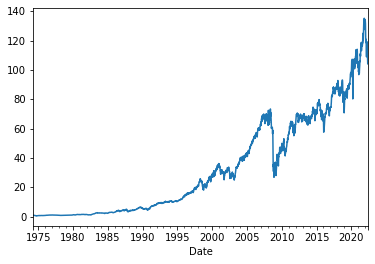

In [31]:
# find Portfolio returns 
# data.shift(1) multiply by weekly weights and sum 

portfolio = data[251:].mul(weekly_weights[:-1]).sum(axis = 1)

# compounding return 
(1+portfolio).cumprod().plot()


In [32]:
# Monthly mean return
portfolio.mean()*100*4

0.9020753753184719

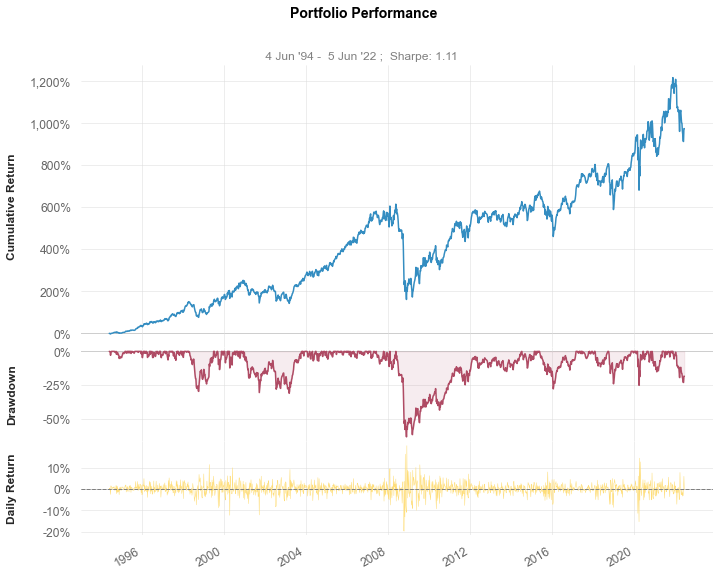

In [33]:
import quantstats as qs

# using 1050: as not enuf SPY data from yahoo 
qs.plots.snapshot(portfolio[1050:], title='Portfolio Performance')


In [34]:
# performance report
qs.reports.html(portfolio[1050:], "SPY")

## Alpha, Beta, Correlation

In [35]:
# benchmark
benchmark = qs.utils.download_returns('SPY').dropna()
benchmark = benchmark.resample('W').sum()

# join the two dataframes
hedge = pd.concat([portfolio, benchmark], axis=1)
hedge.columns = ['Portfolio', 'Benchmark']
hedge = hedge.dropna()
hedge = hedge[:-1]
hedge

,Portfolio,Benchmark
Date,,
1993-02-07,0.049033,0.023291
1993-02-14,0.008466,-0.008307
1993-02-21,-0.006191,-0.023066
1993-02-28,0.005979,0.019276
1993-03-07,0.009545,0.007852
...,...,...
2022-05-01,-0.032672,-0.032048
2022-05-08,-0.015535,-0.000455
2022-05-15,-0.030844,-0.022729


<AxesSubplot:xlabel='Date'>

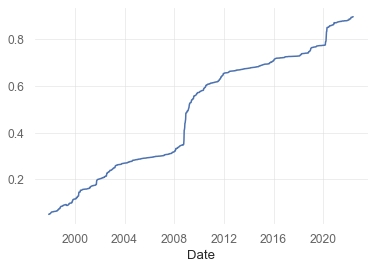

In [36]:
# find correlation between the two columns
corr = []

for i in range(len(hedge)-250):
    corr.append(np.correlate(hedge.iloc[:i+250,0],hedge.iloc[:i+250,1])[0])

sns.lineplot(x = hedge.index[250:], y = corr)

In [37]:
# calculate the alpha and beta using linear regression 
beta = [] 
alpha = []
corr = []


for i in range(len(hedge)-250):

    X = hedge.Benchmark[:250+i].astype(float)
    y = hedge.Portfolio[:250+i].astype(float)

    b, a = stats.linregress(X, y)[:2]
    beta.append(b)
    alpha.append(a)

    corr.append(np.correlate(X,y)[0])

<AxesSubplot:xlabel='Date'>

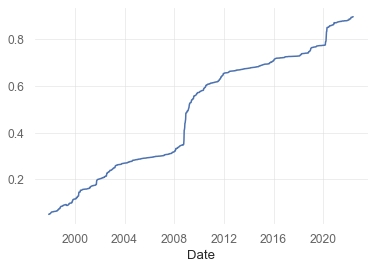

In [38]:
sns.lineplot(x = hedge.index[250:], y = corr)

<AxesSubplot:xlabel='Date'>

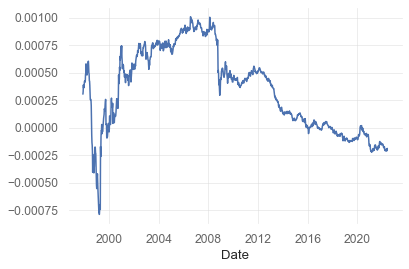

In [39]:
sns.lineplot(x = hedge.index[250:], y = alpha)


From the charts above, we can see that alpha drops after 2008.    
If we examine the relationship between alpha and correlation, it is somewhat similar to a quadratic function. 

A hypothetical way to maintain the alpha is perhaps to hedge based on our understanding of the convex relationship between alpha and correlation.

<AxesSubplot:>

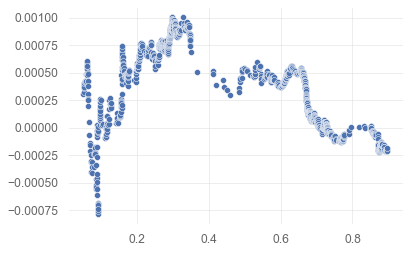

In [40]:
# joint plot of spread and correlation 
sns.scatterplot(x = corr, y = alpha)

<AxesSubplot:>

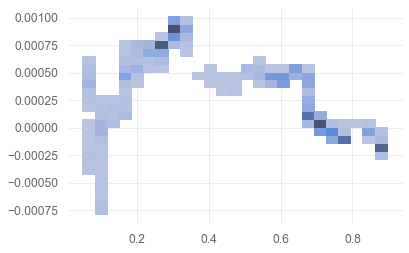

In [41]:
sns.histplot(x = corr, y = alpha, bins=25)

# Dynamic Estimation of parameters
We see ealier that the alpha decay was obvious and appears to decay as correlation with the market increases. we can improve the performance by hedging when the alpha drops and correlation increases.    

Or we can improve our estimation of the parameters by making it time dependent (ie, conditional).   
   
> Using acf on a expanding window basis and find the value that drops below the confidence interval.   
> We also have to modify our code to accomodate multiple asset.  
> **The flow of the code:**  
> 1. find the expanding window unconditional mean of the return 
> 2. run acf on the mean 
> 3. use the acf_co as span for ewm mean 

In [42]:
# Estimate the unconditional mean and subsequently the cut-off of the assets on an expanding window
acf_co = pd.DataFrame(index = data.index[250:], columns = data.columns)

for j in tqdm(range(len(data.columns))):

    for i in range(round((len(data)-250))):

        # estimate unconditional mean
        uncond_mean = data.iloc[:i+250,j].expanding().mean()

        # estimate dependence
        acf = sm.tsa.stattools.acf(uncond_mean, nlags=250, alpha = 0.05, bartlett_confint=True)[1][:,0]
        cutoff = np.argmax(acf < 0.05)
        
        # store the cutoff
        acf_co.iloc[i,j]=cutoff

100%|██████████| 49/49 [02:38<00:00,  3.24s/it]


In [43]:
acf_co

,Agric,Food,Soda,Beer,Smoke,Toys,Fun,Books,Hshld,Clths,...,Boxes,Trans,Whlsl,Rtail,Meals,Banks,Insur,RlEst,Fin,Other
Date,,,,,,,,,,,,,,,,,,,,,
1974-04-21,8,3,9,3,7,9,9,11,13,13,...,13,13,10,9,13,2,6,3,10,3
1974-04-28,8,3,9,3,7,9,9,11,13,13,...,13,13,10,9,13,2,6,3,10,3
1974-05-05,8,3,9,3,7,9,9,11,13,13,...,13,13,10,9,13,2,6,3,10,3
1974-05-12,8,3,9,3,7,9,9,11,13,13,...,13,13,10,9,13,2,6,3,10,3
1974-05-19,8,3,9,3,7,9,9,11,13,13,...,13,13,10,9,13,2,6,3,10,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-05-08,161,230,86,199,74,70,30,208,73,78,...,230,64,81,74,61,171,79,109,124,170
2022-05-15,161,230,86,199,74,70,30,208,73,78,...,230,64,81,74,61,171,79,109,124,170
2022-05-22,161,230,86,199,74,70,30,208,73,78,...,230,64,81,74,61,171,79,109,124,170


In [44]:
len(data)

2762

In [45]:
px.line(acf_co)

In [46]:
# Estimate the unconditional mean of the assets on an expanding window
asset_mean = pd.DataFrame(index = data.index[250:], columns = data.columns)

for j in tqdm(range(len(data.columns))):

    for i in range(len(data)-250):
        
        # retrive span
        span = acf_co.iloc[i,j]

        # estimate the conditional mean using ewm 
        exp_mean_est = data.iloc[:i+250,j].ewm(span=span).mean().iloc[-1]

        # store exp_mean 
        asset_mean.iloc[i,j] = exp_mean_est

100%|██████████| 49/49 [00:54<00:00,  1.12s/it]


In [47]:
exp_mean = asset_mean

# initialise a list to store weights, it will be a 2d df with date index and asset name as columns 
weekly_weights = []

# loop through the dataset, ignorning the first 250 data as they are unstable but will be used to estimate parameter
for i in tqdm(range(round((len(data)-250)))):

    mu = exp_mean.iloc[i,:]*52

    # covariance shrinkage
    S = risk_matrix(data[:250+i], returns_data=True, frequency=52, log_returns=False, method='semicovariance')

    # allocation rule 
    ef = EfficientFrontier(mu, S, weight_bounds=weight_bounds)

    # clean Negligible weights
    ef.add_objective(objective_functions.L2_reg, gamma=0.1)
    w = ef.max_sharpe(risk_free_rate=0.02)

    weekly_weights.append(ef.clean_weights())

weekly_weights = pd.DataFrame(weekly_weights, index=data[250:].index)


  0%|          | 0/2512 [00:00<?, ?it/s]/opt/anaconda3/lib/python3.8/site-packages/pypfopt/efficient_frontier/efficient_frontier.py:257: UserWarning:

max_sharpe transforms the optimization problem so additional objectives may not work as expected.

100%|██████████| 2512/2512 [00:56<00:00, 44.43it/s]


In [48]:
weekly_weights

,Agric,Food,Soda,Beer,Smoke,Toys,Fun,Books,Hshld,Clths,...,Boxes,Trans,Whlsl,Rtail,Meals,Banks,Insur,RlEst,Fin,Other
Date,,,,,,,,,,,,,,,,,,,,,
1974-04-21,-0.03089,0.00048,0.01256,-0.10000,-0.05262,0.07131,-0.07435,0.08419,0.05907,0.06191,...,0.10000,0.10000,0.10000,0.02988,0.05455,-0.04328,-0.10000,-0.10000,0.01000,-0.10000
1974-04-28,0.01436,0.10000,-0.00381,0.10000,0.07503,0.03790,-0.10000,-0.00715,0.01806,0.01213,...,0.10000,0.06682,0.10000,0.01248,0.05621,0.10000,-0.10000,-0.10000,-0.04664,-0.01435
1974-05-05,-0.01877,0.06007,0.01365,-0.00537,0.03628,0.01730,-0.04770,0.04313,0.09573,0.04122,...,0.10000,0.07376,0.10000,0.10000,0.07523,-0.10000,-0.10000,-0.10000,-0.01579,-0.10000
1974-05-12,-0.09783,0.10000,-0.10000,0.10000,0.10000,-0.02838,-0.01854,-0.02088,0.04281,-0.04434,...,0.03392,0.01963,0.08374,0.10000,0.00207,-0.00644,-0.10000,-0.10000,-0.10000,0.02084
1974-05-19,-0.10000,0.10000,0.06282,0.10000,0.10000,-0.00128,0.04555,0.02314,0.05771,-0.01987,...,0.06602,0.02077,0.05790,0.10000,0.06593,-0.10000,-0.10000,-0.10000,-0.09151,-0.10000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-05-08,0.10000,0.08803,0.08009,0.07718,0.09970,-0.10000,-0.10000,0.03332,0.04652,-0.05330,...,0.05299,-0.03185,0.07292,-0.02983,-0.01280,0.02036,0.08239,0.00234,0.01118,0.03798
2022-05-15,0.10000,0.09155,0.08341,0.07831,0.10000,-0.10000,-0.10000,0.01679,0.03385,-0.09461,...,0.05076,-0.04418,0.07970,-0.04632,-0.02313,0.02518,0.08615,-0.00417,0.01454,0.03991
2022-05-22,0.10000,0.10000,0.10000,0.09439,0.10000,-0.10000,-0.10000,0.03167,0.03730,-0.09242,...,0.05354,-0.04849,0.08807,-0.04649,-0.03909,0.02482,0.08259,0.00044,0.01905,0.04435


In [49]:
# find the returns for the portfolio
portfolio = data[251:].mul(weekly_weights[:-1]).sum(axis = 1)

In [50]:
# generate report
qs.reports.html(portfolio[1050:], "SPY")

In [51]:
# benchmark
benchmark = qs.utils.download_returns('SPY').dropna()
benchmark = benchmark.resample('W').sum()

# join the two dataframes
hedge = pd.concat([portfolio, benchmark], axis=1)
hedge.columns = ['Portfolio', 'Benchmark']
hedge = hedge.dropna()
hedge = hedge[:-1]
hedge

,Portfolio,Benchmark
Date,,
1993-02-07,0.035020,0.023292
1993-02-14,-0.008243,-0.008308
1993-02-21,-0.008647,-0.023066
1993-02-28,0.009134,0.019276
1993-03-07,0.009913,0.007852
...,...,...
2022-05-01,-0.016697,-0.032048
2022-05-08,0.012883,-0.000455
2022-05-15,-0.032455,-0.022729


In [52]:
# calculate the alpha and beta using linear regression 
beta = [] 
alpha = []
corr = []


for i in range(len(hedge)-250):

    X = hedge.Benchmark[:250+i].astype(float)
    y = hedge.Portfolio[:250+i].astype(float)

    b, a = stats.linregress(X, y)[:2]
    beta.append(b)
    alpha.append(a)

    corr.append(np.correlate(X,y)[0])

<AxesSubplot:xlabel='Date'>

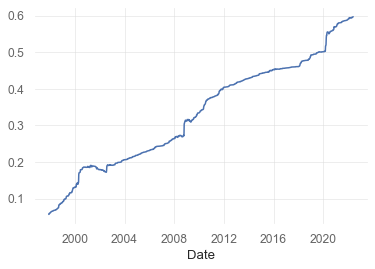

In [53]:
sns.lineplot(x = hedge.index[250:], y = corr)

<AxesSubplot:xlabel='Date'>

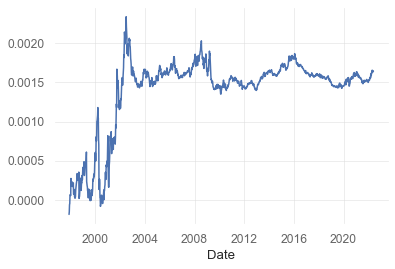

In [54]:
sns.lineplot(x = hedge.index[250:], y = alpha)

<AxesSubplot:>

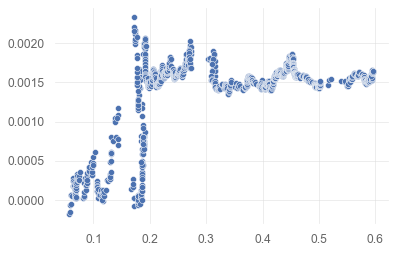

In [55]:
# joint plot of spread and correlation 
sns.scatterplot(x = corr, y = alpha)

# Drawbacks and Further Improvement
1. Using two stages to derive the conditional mean require more data so that to ensure our estimation is relatively stable. A breakdown: we first estimate the unconditional mean (cutting away first 250 values), then we estimate the cut-off of acf (nlags=250, does not affect, it's just lags), then we estimate the conditional mean using the original return data (cutting off the first 250 values).  

2. Increassing correlation with the market, this can be attributed to the depencedcy of the dynamically estimated exponential mean on the market. The higher the dependence value, the stronger the correlation, the lower the alpha. One way to solve it is perhaps to limit the assets we choose so that we reduce the dependence. 

3. The dependence we modelled earlier does not have to be linear.
  
4. With the understanding of the dependence, the goal of securing alpha then becomes reducing long-term dependency on the market or to keep the correlation with the market at an optimal level. This can be achieved by hedging or more diversification (global diversification)  

5. Robustness becomes hard to test. 

6. Transaction cost might eliminate the alpha.

7. Exponentially weighted semi-covariance. As we see ealier, exponentially weighting for risk actually improves the performance. unfortunately, there is no way to test this as there is no method implemented for this yet.

8. The challenges involving weekly reallocation, execution algo might help as reducing market impact is necessary for large allocation of fund.

9. Hedging to ensure alpha stability based on convexity → potential issue, data availability and model changes; Use regression on price to determine hedge (similar to basic statistical arbitrage). Or hedge based on the weights changes

# References
